# Basic Segmentation and Discrete Binary Structures

<p>

__Quantitative Big Imaging__ ETHZ: 227-0966-00L

    
__Part 1__: Image formation and thresholding
    
</p>

<p style="font-size:1em;">March 16, 2023</p>
<br /><br />
<p style="font-size:1.5em;padding-bottom: 0.25em;">Anders Kaestner</p>  
<p style="font-size:1em;">Laboratory for Neutron Scattering and Imaging<br />Paul Scherrer Institut</p>

## Today's lecture

- Motivation
- Qualitative Approaches
- Image formation and interpretation problems
- Thresholding
 - Other types of images
 - Selecting a good threshold
- Implementation
- Morphology
- Partial volume effects

## Load some modules

In [43]:
from skimage.io          import imread
from skimage.color       import rgb2gray
import matplotlib.pyplot as plt
from skimage.morphology  import disk
from scipy.ndimage       import zoom
import numpy             as np
import pandas as pd
from skimage.morphology import ball
import tifffile as tiff
import plotsupport as ps

%matplotlib inline

# For the 3D rendering
import plotly.offline as py
from plotly.figure_factory import create_trisurf
from skimage.measure import marching_cubes

## Applications

In this lecture we are going to focus on basic segmentation approaches that work well for simple two-phase materials. Segmenting complex samples like  
- Beyond 1 channel of depth
- Multiple phase materials
- Filling holes in materials
- Segmenting Fossils
- Attempting to segment the cortex in brain imaging (see figure below)

can be a very challenging task. Such tasks will be covered in later lectures.

```{figure} figures/cortex.png
---
scale: 50%
---
An x-ray CT slice of the cortex.
```

<table>
    <tr>
        <td>
        
- Simple two-phase materials (bone, cells, etc)
- Beyond 1 channel of depth
    - Multiple phase materials
    - Filling holes in materials
    - Segmenting Fossils
    - Attempting to segment the cortex in brain imaging

</td>
<td>
<figure>    
<img src="figures/cortex.png" style="height:500px" />
<figcaption>The cortex in brain imaging</figcaption>
</figure>
</td></tr></table>

## Literature / Useful References

- [John C. Russ, “The Image Processing Handbook”,(Boca Raton, CRC Press)](http://dx.doi.org/10.1201/9780203881095) within domain ethz.ch (or proxy.ethz.ch / public VPN) 

### Models / ROC Curves

- [Julia Evans - Recalling with Precision](https://www.youtube.com/watch?v=ryZL4XNUmwo)
- [Stripe's Next Top Model](https://github.com/stripe/topmodel)

# Motivation:  Why do we do imaging experiments?

There are different reasons for performing an image experiment. This often depends on in which state you are in your project. 

## Exploratory

In the initial phase, you want to learn what your sample looks like with the chosen modality. Maybe, you don't even know what is in there to see. The explorative type of experiment mostly only allows qualitative conclusions. These conclusions will however help you to formulate better hypotheses for more detailed experiments.

 - To visually, qualitatively examine samples and differences between them
 - No prior knowledge or expectations
 
## To test a hypothesis

When you perform an experiment to test a hypothesis, you already know relatively much about your sample and want make an investigation where you can quantify characteristic features.

Quantitative assessment coupled with statistical analysis
 - Does temperature affect bubble size?
 - Is this gene important for cell shape and thus mechanosensation in bone?
 - Does higher canal volume make bones weaker?
 - Does the granule shape affect battery life expectancy?

## What we are looking at?

<figure>    
<img src="figures/Average_prokaryote_cell.svg" style="height:600px" />
<figcaption><a href="http://en.wikipedia.org/wiki/File:Average_prokaryote_cell-_en.svg">Standard Cell</a></figcaption>
</figure>

## To test a hypothesis

We perform an experiment bone to see how big the cells are inside the tissue:

We have performed an experiment that produced heaps of data to analyze. For example a using tomography.

```{figure} figures/tomoimage.png
---
scale: 100%
---
Acquisition workflow to obtain CT slices of a specimen.
```

At the beginning we have 2560 x 2560 x 2160 x 32 bits = 56GB / sample! Then we apply some filtering and preprocessing to prepare the data for analysis. After 20h of computer time we still have 56GB of data (it is however nicer to work with). This still way to much data to handle, we need to reduce it in some way.

 <img src="figures/tomoimage.png" style="width:60%"> 

<center><b>2560 x 2560 x 2160 x 32 bit = 56GB / sample</b></center>
    $$\downarrow$$ 
<center>Filtering and Preprocessing!  </center>
    
$$\downarrow$$

<center><b>20h of computer time later ...</b></center>

<center>Still 56GB of data, but less noisy</center>

<div class="alert alert-block alert-warning">
<center>
    
__Way too much data, we need to reduce__
    
</center>
</div>

## What did we want in the first place?


### *Single numbers*:
* Volume _fraction_,
* Cell _count_,
* Average cell _stretch_,
* Cell volume _variability_

> These are all __measurable__ metrics!

## Why do we perform segmentation?

In model-based analysis every step we peform, simple or complicated is related to an underlying model of the system we are dealing with

- Identify relevant regions in the images
- Many methods are available to solve the segmentation task. 
- Choose wisely... [_Occam's Razor_](http://en.wikipedia.org/wiki/Occams_Razor) is very important here : __The simplest solution is usually the right one__

Advanced methods like a Bayesian, neural networks optimized using genetic algorithms with Fuzzy logic has a much larger parameter space to explore, establish sensitivity in, and must perform much better and be tested much more thoroughly than thresholding to be justified. 
 

The next two lectures will cover powerful segmentation techinques, in particular with unknown data.

## Review: Filtering and Image Enhancement 

This was a noise process which was added to otherwise clean imaging data

<center><img src="../Lecture-03/figures/imperfect_imaging_system.svg" style="height:350px" align="middle"></center>

$$ I_{measured}(x,y) = I_{sample}(x,y) + \text{Noise}(x,y) $$

- What would the perfect filter be

$$ \textit{Filter} \ast I_{sample}(x,y) = I_{sample}(x,y) $$
<br/>
 $$ \textit{Filter} \ast \text{Noise}(x,y) = 0 $$ 
 <br/>
 $$ \textit{Filter} \ast I_{measured}(x,y) = \textit{Filter} \ast I_{real}(x,y) + \textit{Filter}\ast \text{Noise}(x,y) \rightarrow \bf I_{sample}(x,y) $$



<div class="alert alert-block alert-success">

What __most filters__ end up doing
$$ \textit{Filter} \ast I_{measured}(x,y) = 90\%  I_{real}(x,y) + 10\% \text{Noise}(x,y) $$
    
</div> 


<div class="alert alert-block alert-danger">

What __bad filters__ do
$$ \textit{Filter} \ast I_{measured}(x,y) = 10\% I_{real}(x,y) + 90\% \text{Noise}(x,y) $$
    
</div> 


## What we get from the imaging modality

To demonstrate what we get from a modality, we load rubber duck radiograph as a toy example.

In [2]:
%matplotlib inline
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pyplot as plt

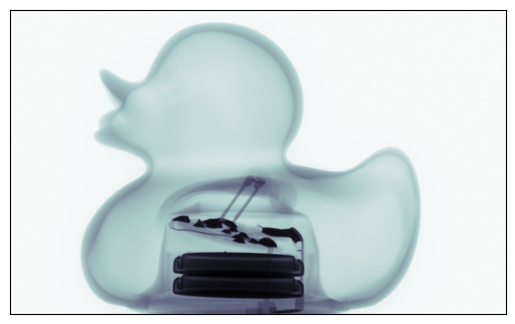

In [3]:
fig,ax=plt.subplots(1)
dkimg = imread("figures/duck/normalized.tif")
ax.imshow(dkimg, cmap = 'bone');
ax.set_xticks([]); ax.set_yticks([]);

# Qualitative Metrics: What did people use to do?

What comes out of our detector / enhancement process 

In [4]:
%matplotlib inline
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pyplot as plt

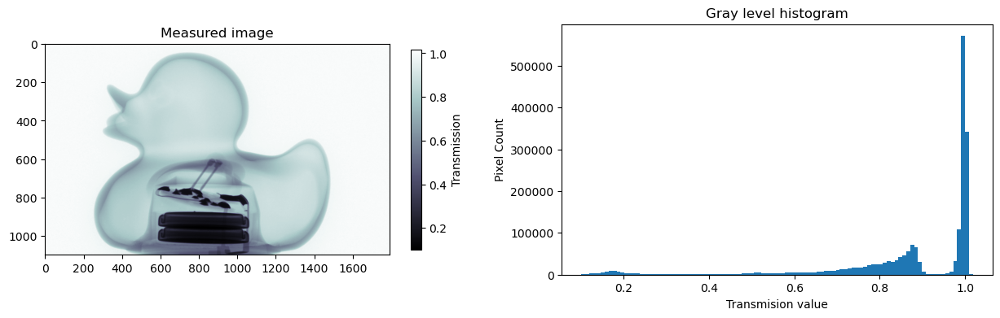

In [5]:
dkimg = tiff.imread("figures/duck/normalized.tif")
fig, (ax_img, ax_hist) = plt.subplots(1, 2, figsize = (15,4))

m_show_obj = ax_img.imshow(dkimg, cmap = 'bone')
cb_obj = fig.colorbar(m_show_obj,ax=ax_img,shrink=0.8)
cb_obj.set_label('Transmission'), ax_img.set_title('Measured image')

ax_hist.hist(dkimg.ravel(),bins=100)
ax_hist.set_xlabel('Transmision value')
ax_hist.set_ylabel('Pixel Count'), ax_hist.set_title('Gray level histogram');


## Identify objects by eye

The first qualitative analysis is mostly done by eye. You look at the image to describe what you see. This first assessment will help you decide how to approach the quantitative analysis task. Here, it is important to think about using words that can be translated into an image processing workflow.

 - Count, 
 - Describe qualitatively: "batteries in the bottom", "solder spots on PCB", "Thin skin"
 
## Morphometrics
 - Trace the outline of the object (or sub-structures)

# Segmentation Approaches

In the introduction lecture we talked about how people approach an image analysis problem depending on their background. This is something that becomes very clear when an image is about to be segmented. 

They match up well to the world view / perspective 

<img src="../Lecture-01/figures/approaches.png" style="height:600px" />

## How to approach the segmentation task

### Model based segmentation
The experimentalists approached the segmenation task based on their experience and knowledge about the samples. This results in a top-down approach and quite commonly based on models fitting the real world, what we actually can see in the images. The analysis aims at solving the problems needed to provide answers to the defined hypothesis.

### Algorithmic segmentation approach
The opposite approach is to find and use generalized algorithms that provides the results. This approach is driven by the results as the computer vision and deep learning experts often don't have the knowledge to interpret the data.


<font size="10em">
<table>
<tr><th>
Model-Based        
</th>
<th>
Machine Learning Approach  
</th></tr>
<tr><td>    
Experimentalist   
</td>
<td>
Computer Vision / Deep Learning    
</td></tr>    
<tr><td valign="top">
Problem-driven
<li>Top-down</li>
<li><b>Reality</b> Model-based</li>
</td><td valign="top">
Results-driven    
</td></tr>    
</table>
</font>

## Model-based Analysis


The image formation process is the process to use some kind of excitation or impulse probe a sample. This requires the interaction of the four parts in the figure below.
 
```{figure} ../Lecture-01/figures/image-formation.pdf
---
scale: 80%
---
The elements of the image formation process.
```

- __Impulses__ Light, X-Rays, Electrons, A sharp point, Magnetic field, Sound wave
- __Characteristics__ Electron Shell Levels, Electron Density, Phonons energy levels, Electronic, Spins, Molecular mobility
- __Response__ Absorption, Reflection, Phase Shift, Scattering, Emission
- __Detection__ Your eye, Light sensitive film, CCD / CMOS, Scintillator, Transducer

<img src="../Lecture-01/figures/image-formation.svg" style="height:500px" />

- Many different imaging modalities:  
    micro-CT to MRI to Confocal to Light-field to AFM. 
- Similarities in underlying equations, but different _coefficients_, _units_, and _mechanism_

$$I_{measured}(\vec{x})=F_{system}(I_{stimulus}(\vec{x}),S_{sample}(\vec{x}))$$

### Direct Imaging (simple)

In many setups there is un-even illumination caused by incorrectly adjusted equipment and fluctations in power and setups

$$F_{system}(a,b)=a*b$$

$$I_{stimulus}=\textrm{Beam}_{profile}$$
$$S_{system}=\alpha(\vec{x})\longrightarrow\alpha(\vec{x})=\frac{I_{measured}(\vec{x})}{\textrm{Beam}_{profile}(\vec{x})}$$


Let's create a simulated image acquisition with the cell image where you have beam profile that is penetrating the sample:

In [6]:
%matplotlib inline
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
from skimage.morphology import disk
from scipy.ndimage import zoom
import numpy as np

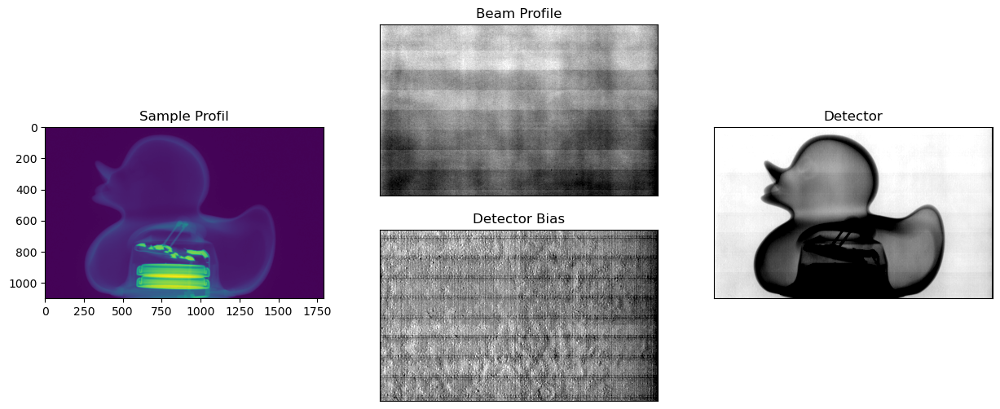

In [7]:
duck_img      = tiff.imread("figures/duck/neglognorm.tif")
duck_imgn     = tiff.imread("figures/duck/normalized.tif")
beam_img      = tiff.imread("figures/duck/ob.tif")
detector_bias = tiff.imread("figures/duck/dc.tif")
detector_img  = tiff.imread("figures/duck/duck90.tif")  

fig =plt.figure(figsize=(15,6))
ax_beam = plt.subplot2grid(shape=(2,3 ), loc=(0, 1))
ax_img  = plt.subplot2grid(shape=(1,3),  loc=(0, 0))
ax_det  = plt.subplot2grid(shape=(1,3),  loc=(0, 2))
ax_bias = plt.subplot2grid(shape=(2,3),  loc=(1, 1))

m,s = (beam_img-detector_bias).mean(), (beam_img-detector_bias).std()
ax_beam.imshow(beam_img-detector_bias, clim=[m-s,m+s], cmap = 'gray'); ax_beam.set_title('Beam Profile')
ax_beam.set_xticks([]), ax_beam.set_yticks([]);
m,s = detector_bias.mean(), detector_bias.std()
ax_bias.imshow(detector_bias, clim=[m-s,m+s], cmap = 'gray'); ax_bias.set_title('Detector Bias')
ax_bias.set_xticks([]), ax_bias.set_yticks([]);
ax_img.imshow(duck_img,    cmap = 'viridis'); ax_img.set_title('Sample Profil')
ax_beam.set_xticks([]), ax_beam.set_yticks([]);
m,s = detector_img.mean(), detector_img.std()
ax_det.imshow(detector_img, clim=[m-0.7*s,m+0.7*s],cmap = 'gray'); ax_det.set_title('Detector');
ax_det.set_xticks([]), ax_det.set_yticks([]);

### Profiles across the image

A first qualitative analysis on images of this type is to extract line profiles to see how the transmitted intensity changes across the sample. What we can see in this particular example is that the acquired profile tapers off with the beam intensity. With this in mind, it may come clear to you that you need to normalize the images by the beam profile.

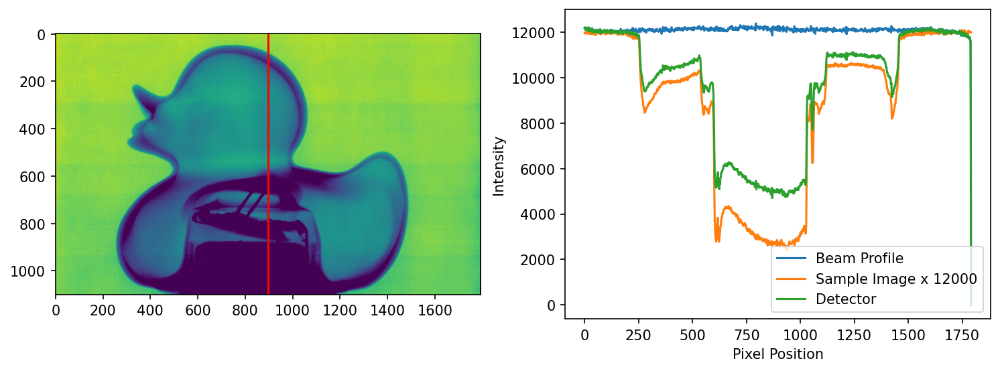

In [20]:
fig, ax = plt.subplots(1, 2, figsize = (12,4),dpi=150)
m,s=detector_img.mean(),detector_img.std()
ax[0].imshow(detector_img,clim=[m-s,m+s]); 
ax[0].axvline(beam_img.shape[1]//2,color='red')
ax[1].plot(beam_img[beam_img.shape[1]//2], label = 'Beam Profile')
ax[1].plot(12000*duck_imgn[beam_img.shape[1]//2], label = 'Sample Image x 12000')
ax[1].plot(detector_img[detector_img.shape[1]//2], label = 'Detector')
ax[1].set_ylabel('Intensity'); ax[1].set_xlabel('Pixel Position');ax[1].legend(loc="lower right");

### Inhomogeneous illumination
Frequently there is a fall-off of the beam away from the center (as is the case of a Gaussian beam which frequently shows up for laser systems). 

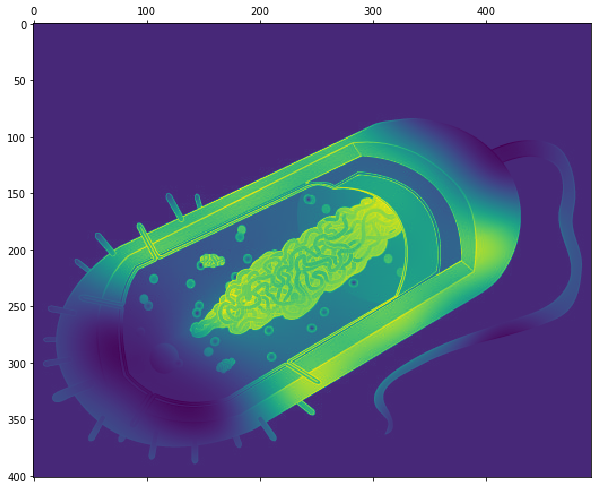

In [23]:
fig, ax1 = plt.subplots(1,1, figsize = (10,10))
ax1.matshow(cell_img*beam_img,cmap = 'viridis');

This can make extracting detail away from the center much harder.

### Absorption Imaging (X-ray, Ultrasound, Optical)

__For absorption/attenuation imaging $\rightarrow$ [Beer-Lambert Law](http://en.wikipedia.org/wiki/Attenuation_coefficient)__
$$I_{detector}=\underbrace{I_{source}}_{I_{stimulus}}\underbrace{e^{-\alpha d}}_{S_{sample}}$$

Different components have a different $\alpha$ based on the strength of the interaction between the light and the chemical / nuclear structure of the material

$$I_{sample}(x,y)=I_{source}\cdot{}e^{-\alpha(x,y)\cdot{}d}$$
<br/>
$$\alpha=f(N,Z,\sigma,\cdots)$$


__For segmentation this model is:__
 - there are 2 (or more) distinct components that make up the image
 - these components are distinguishable by their values (or vectors, colors, tensors, ...)


In [123]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

### A numerical transmission imaging example (1D)

In this example we create a sample with three different materials and the sample thickness 1.0. The attenuation coefficient is modelled by random models to give them some realistic spread. 

The transmission uses Beer Lambert's law.

In [44]:
I_source = 1.0
d = 1.0
alpha_1 = np.random.normal(1, 0.25, size = 100) # Material 1
alpha_2 = np.random.normal(2, 0.25, size = 100) # Material 2
alpha_3 = np.random.normal(3, 0.50, size = 100) # Material 3

abs_df = pd.DataFrame([dict(alpha = c_x, material = c_mat) for c_vec, c_mat in zip([alpha_1, alpha_2, alpha_3], 
                       ['material 1', 'material 2', 'material 3']) for c_x in c_vec])

abs_df['I_detector'] = I_source*np.exp(-abs_df['alpha']*d)
abs_df.sample(5)

,alpha,material,I_detector
224,3.271295,material 3,0.037957
222,4.064642,material 3,0.017169
148,2.111675,material 2,0.121035
156,1.824568,material 2,0.161287
46,0.963788,material 1,0.381445


In the table, you can see that we measure different intensities on the detector depending on the material the beam is penetrating.

#### Plotting measured intensities

Let's now plot the intensities and attenuation coefficients and compare the outcome of our transmission experiment.

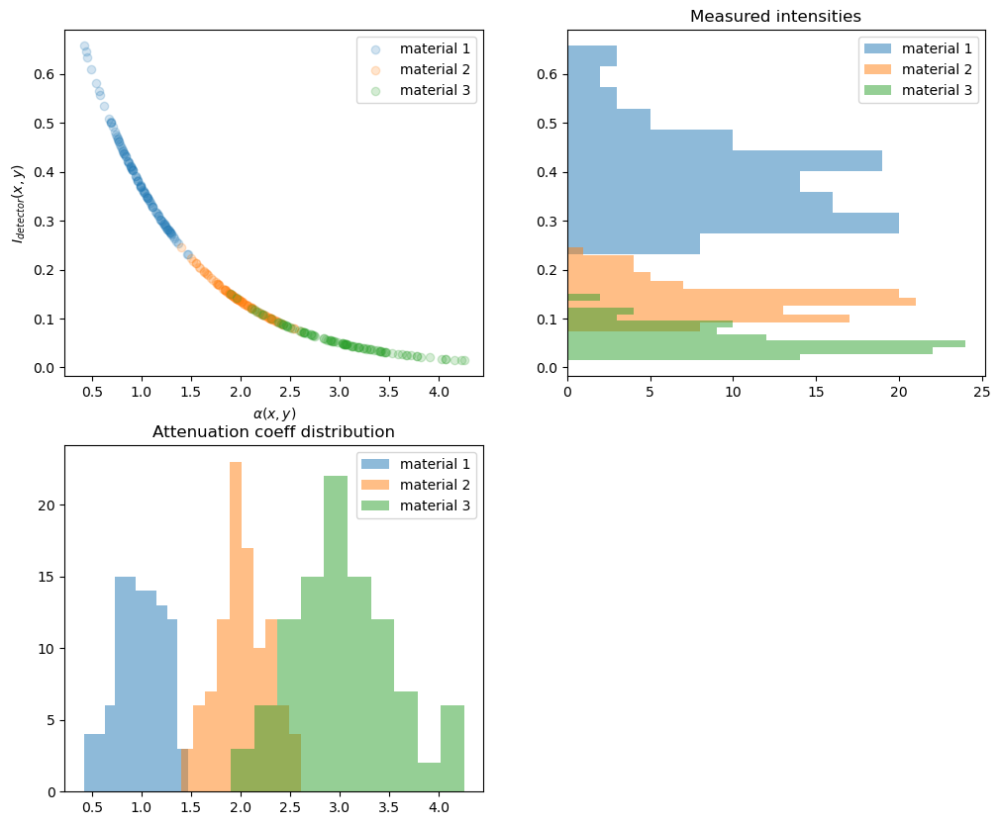

In [52]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize = (12, 10))
for c_mat, c_df in abs_df.groupby('material'):
    ax1.scatter(x = c_df['alpha'], 
                y = c_df['I_detector'], 
                label = c_mat,alpha=0.2)
    ax3.hist(c_df['alpha'], alpha = 0.5, label = c_mat)
    ax2.hist(c_df['I_detector'],  alpha = 0.5, label = c_mat, orientation="horizontal")
ax1.set_xlabel('$\\alpha(x,y)$'); 
ax1.set_ylabel('$I_{detector}(x,y)$')
ax1.legend(); 
ax2.legend(); 
ax2.set_title('Measured intensities')
ax3.legend(loc = 0); 
ax3.set_title('Attenuation coeff distribution')
ax4.axis('off');


The material are differently represented!

## Flatten a transmission image


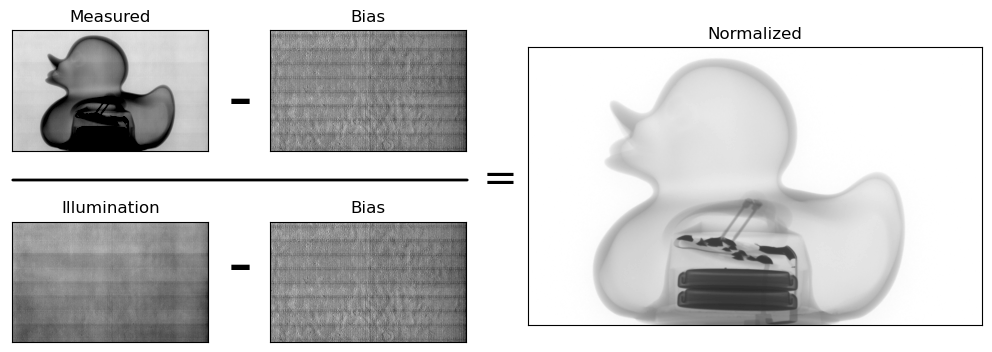

In [8]:
ps.visualize_normalization(detector_img,beam_img,detector_bias,duck_imgn)

The $\alpha$-$I_{detector}$ plot shows the curved exponential behaviour we can expect from Beer Lambert's law. Now, if we look at the histogram, we can see that distribution of attenuation coefficients doesn't really match the measured intensity. In this example, it is even so that the widths of the diffent materials have changed places. Great attenuation coefficient results in little transmission and small attenuation coefficient allow more of the beam to penetrate the sample.

# Example Mammography
Mammographic imaging is an area where model-based absorption imaging is problematic. 

Even if we assume a constant illumination (_rarely_ the case), 

$$I_{detector}=\underbrace{I_{source}}_{I_{stimulus}}\underbrace{\exp(-\alpha d)}_{S_{sample}}$$
$$\downarrow$$
$$I_{detector}=\exp(-\alpha(x,y) d(x,y))$$
$$\downarrow$$
$$I_{detector}=\exp\left(-\int_{0}^{l}\alpha(x,y, z) dz\right)$$


The assumption that the attenuation coefficient, $\alpha$, is constant is rarely valid. Then you see that the exponent turns into an integral along the probing ray and that $\alpha$ is a function of the position in the sample. This of course leads ambiguity in the interpretation of what the pixel intensity really means.

## Problems to interpret radiography images
Specifically the problem is related to the inability to separate the 
- $\alpha$ - attenuation
- $d$ - thickness
terms. 

To demonstrate this, we model a basic breast volume as a half sphere with a constant absorption factor:

| | Air | Breast tissue |
|:---:|:---:|:---:|
|$\alpha(x,y,z)$| 0| 0.01 |

$\rightarrow$ The $\int$ then turns into a $\Sigma$ in discrete space




## Building a breast phantom
The breast is here modelled as a half sphere of constant attenuation coefficient:

In [22]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from skimage.morphology import ball

# For the 3D rendering
import plotly.offline as py
from plotly.figure_factory import create_trisurf
from skimage.measure import marching_cubes

In [23]:
breast_mask = ball(50)[:,50:]  # This is our model

In [24]:
# just for 3D rendering, don't worry about it
py.init_notebook_mode()
vertices, simplices, _, _ = marching_cubes(breast_mask>0)
x,y,z = zip(*vertices) 
fig = create_trisurf(   x=x, y=y, z=z, 
                        plot_edges=False,
                        simplices=simplices,
                        title="Breast Phantom")
py.iplot(fig)

### Transmission image of the breast phantom

Our first step is to simulate a transmission image of the breast. This is done by 
1. Summing the attenuation coefficents times the pixel size.
2. Applying Beer-Lambert's law

This produces a 2D image of the side view of the breast.

In [25]:
breast_alpha = 1e-2                           # The attenuation coefficient
pixel_size   = 0.1                            # The simulated detector has 1mm pixels
breast_vol   = breast_alpha*breast_mask       # Scale the image intensity by attenuation coefficient
i_detector   = np.exp(-np.sum(breast_vol,axis=2)*pixel_size)  # Compute the transmission through the phantom

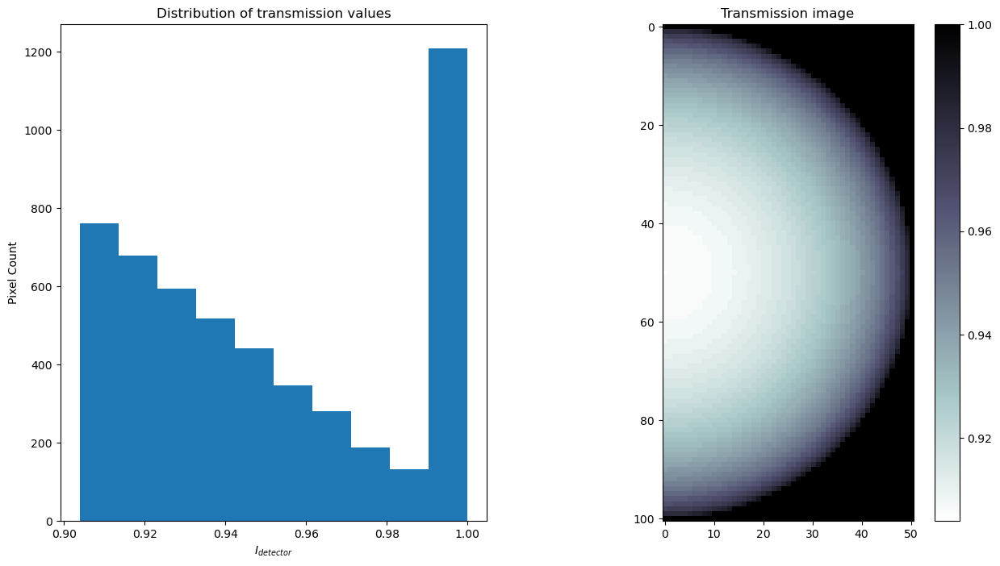

In [26]:
fig, (ax_hist, ax_breast) = plt.subplots(1, 2, figsize = (15,8))

b_img_obj = ax_breast.imshow(i_detector, cmap = 'bone_r'); 
plt.colorbar(b_img_obj) ;
ax_breast.set_title('Transmission image')

ax_hist.hist(i_detector.flatten());
ax_hist.set_xlabel('$I_{detector}$');
ax_hist.set_ylabel('Pixel Count');
ax_hist.set_title('Distribution of transmission values');

The histogram shows the distribution of the transmitted intensity. 

### Compute the thickness
If we know that $\alpha$ is constant we can reconstruct the thickness $d$ from the image:

$$ d = -\log(I_{detector})/\alpha$$

This is only valid because we have air ($\alpha=0$) as the second component in the phantom. Otherwise, if it was a denser material we would have a material mixture.

Now, let's compute the breast thickness from the transmission image:

In [27]:
breast_thickness = -np.log(i_detector)/breast_alpha # Compute the thickness

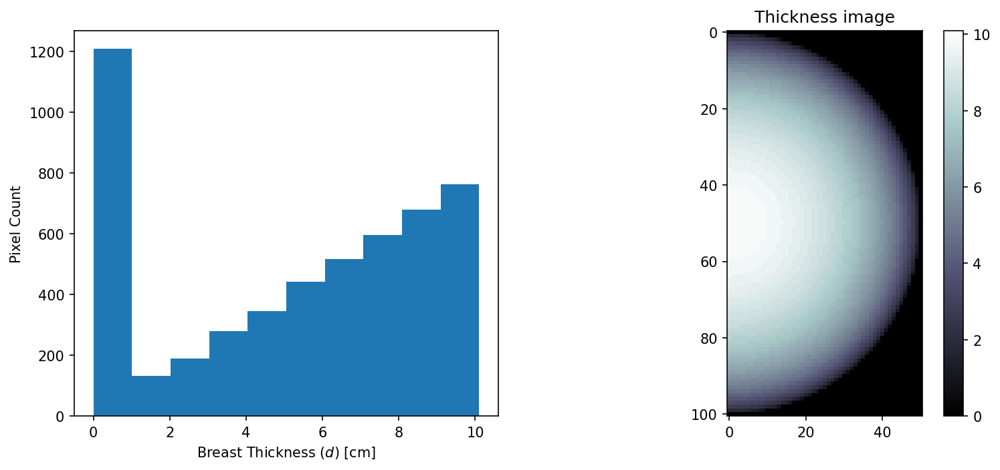

In [28]:
fig, (ax_hist, ax_breast) = plt.subplots(1, 2, figsize = (12,5), dpi=150)

b_img_obj = ax_breast.imshow(breast_thickness, cmap = 'bone'); ax_breast.set_title('Thickness image')
plt.colorbar(b_img_obj)

ax_hist.hist(breast_thickness.flatten()) ; ax_hist.set_xlabel('Breast Thickness ($d$) [cm]'); ax_hist.set_ylabel('Pixel Count');

### Visualizing the thickness

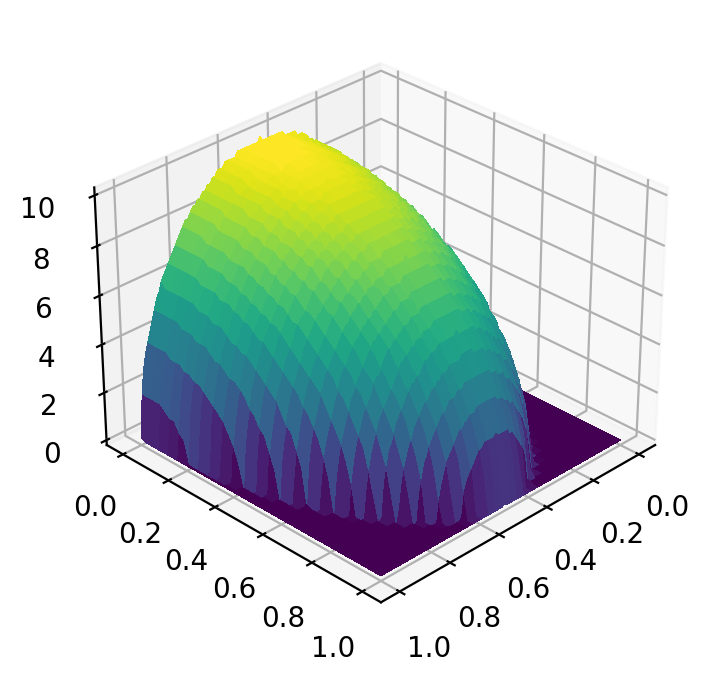

In [29]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize = (8, 4), dpi = 200)
# ax  = fig.gca(projection='3d')
ax = fig.add_subplot(1, 1, 1, projection='3d')
# Plot the surface.
yy, xx = np.meshgrid(np.linspace(0, 1, breast_thickness.shape[1]),
                     np.linspace(0, 1, breast_thickness.shape[0]))
surf = ax.plot_surface(xx, yy, breast_thickness, cmap=plt.cm.viridis,
                       linewidth=0, antialiased=False)
ax.view_init(elev = 30, azim = 45)
ax.set_zlabel('Breast Thickness');

## What if alpha is not constant?
We run into problems when the $\alpha$ is no longer constant. 

- For example if we place a dark lump in the center of the breast. 

- It is __impossible__ to tell if the breast is _thicker_ or if the lump inside is _denser_. 

For the lump below we can see on the individual slices of the sample that the lesion appears quite clearly and is very strangely shaped.

In [35]:
breast_vol   = breast_alpha*breast_mask
renorm_slice = np.sum(breast_mask[10:40, 0:25], 2)/np.sum(breast_mask[30, 10])
breast_vol[10:40, 0:25] /= np.stack([renorm_slice]*breast_vol.shape[2],-1)

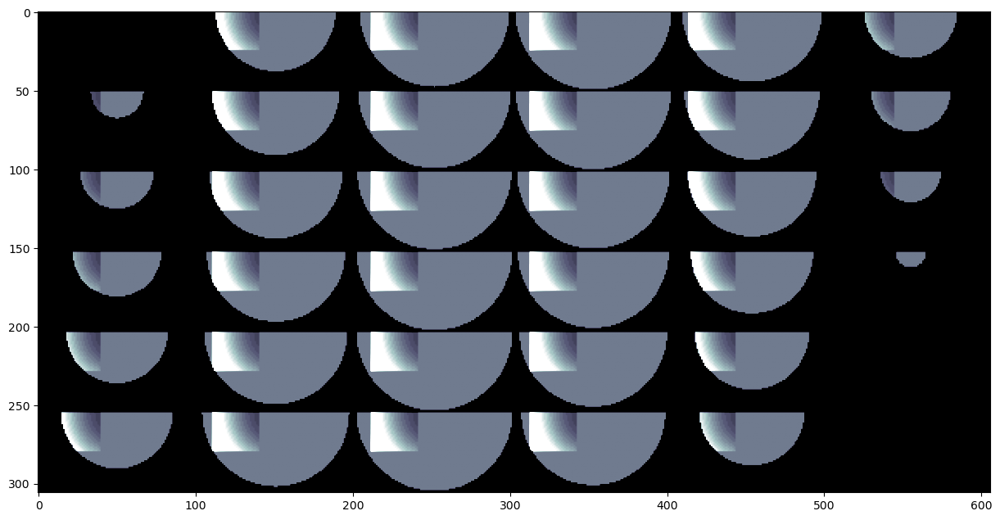

In [36]:
from skimage.util import montage as montage2d
fig, ax1 = plt.subplots(1,1, figsize = (15, 12))
ax1.imshow(montage2d(breast_vol.swapaxes(0,2).swapaxes(1,2)[::3]).transpose(), 
           cmap = 'bone', vmin = breast_alpha*.8, vmax = breast_alpha*1.2);

### Looking at the thickness again
When we make the projection and apply Beer's Law we see that it appears as a relatively constant region in the image

In [37]:
i_detector = np.exp(-np.sum(breast_vol,2)) # Compute what the detector sees

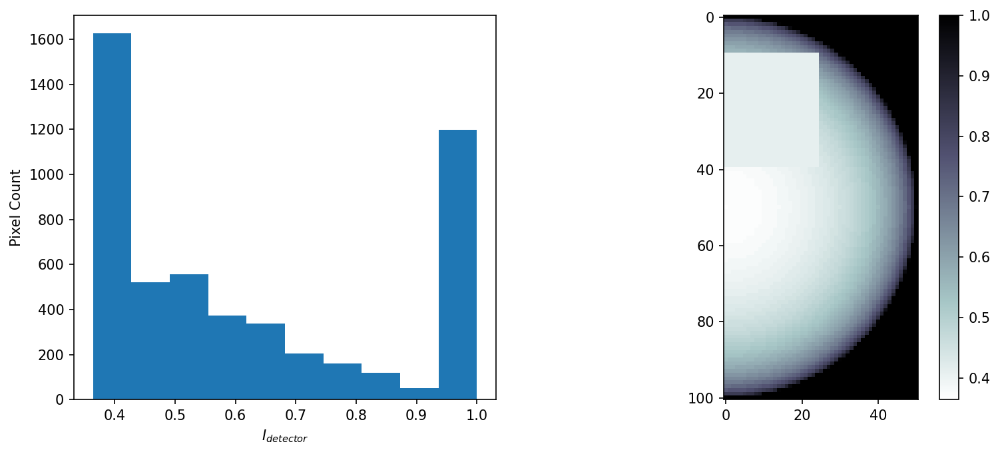

In [38]:
fig, (ax_hist, ax_breast) = plt.subplots(1, 2, figsize = (12,5),dpi=150)

b_img_obj = ax_breast.imshow(i_detector, cmap = 'bone_r')
plt.colorbar(b_img_obj)

ax_hist.hist(i_detector.flatten())
ax_hist.set_xlabel('$I_{detector}$')
ax_hist.set_ylabel('Pixel Count');

### An anomaly in the thickness reconstruction

It appears as a flat constant region in the thickness reconstruction. 

So we fundamentally from this single image cannot answer:
- is the breast oddly shaped?
- or does it have an possible tumor inside of it?


In [39]:
breast_thickness = -np.log(i_detector)/1e-2

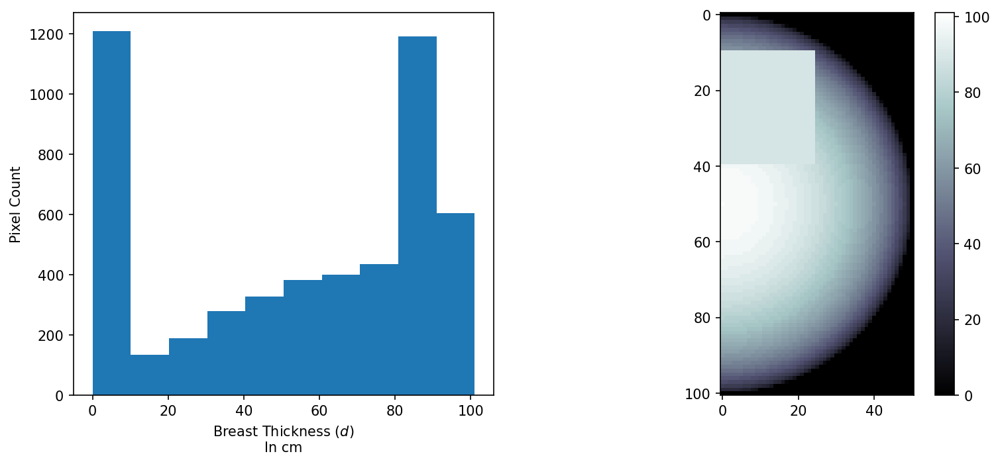

In [40]:
fig, (ax_hist, ax_breast) = plt.subplots(1, 2, figsize = (12,5),dpi=150)
b_img_obj = ax_breast.imshow(breast_thickness, cmap = 'bone')
plt.colorbar(b_img_obj)

ax_hist.hist(breast_thickness.flatten())
ax_hist.set_xlabel('Breast Thickness ($d$)\nIn cm')
ax_hist.set_ylabel('Pixel Count');

### Looking at the thickness profile with lump

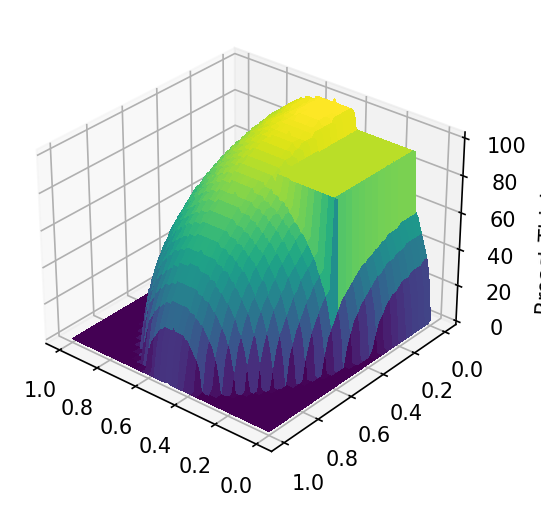

In [41]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize = (8, 4), dpi = 150)
ax  = fig.add_subplot(1,1,1,projection='3d')

# Plot the surface.
yy, xx = np.meshgrid(np.linspace(0, 1, breast_thickness.shape[1]),
                       np.linspace(0, 1, breast_thickness.shape[0]))
surf = ax.plot_surface(xx, yy, breast_thickness, cmap=plt.cm.viridis,
                       linewidth=0, antialiased=False)
ax.view_init(elev = 30, azim = 130)
ax.set_zlabel('Breast Thickness');

# Segmentation

## Where does segmentation get us?

We can convert a decimal value or something even more complicated like 
- 3 values for RGB images,
- a spectrum for hyperspectral imaging, 
- or a vector / tensor in a mechanical stress field

To a single or a few discrete values: 
- usually true or false, 
- but for images with phases it would be each phase, e.g. bone, air, cellular tissue.

__2560 x 2560 x 2160 x 32 bit = 56GB / sample__ $\rightarrow$ 2560 x 2560 x 2160 x **1 bit** = 1.75GB / sample


## Basic segmentation: Applying a threshold to an image
Start out with a simple image of a cross with added noise
$$ I(x,y) = f(x,y) $$

Here, we create a test image with two features embedded in uniform noise; a cross with values in the order of '1' and background with values in the order '0'. The figure below shows the image and its histogram. The histogram helps us to see how the graylevels are distributed which guides the decision where to put a threshold that segments the cross from the background.

In [53]:
nx = 5; ny = 5
xx, yy = np.meshgrid(np.arange(-nx, nx+1)/nx*2*np.pi, 
                      np.arange(-ny, ny+1)/ny*2*np.pi)
cross_im = 1.5*np.abs(np.cos(xx*yy))/(np.abs(xx*yy)+(3*np.pi/nx))+np.random.uniform(-0.25, 0.25, size = xx.shape)

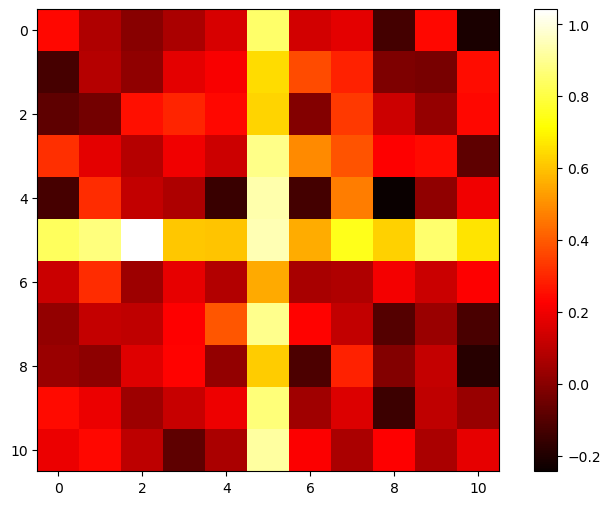

In [54]:
fig,ax = plt.subplots(1,1,figsize=(9,6))
im=ax.imshow(cross_im, cmap = 'hot')
fig.colorbar(im);

## The histogram

The intensity can be described with a probability density function 
$$ P_f(x,y) $$

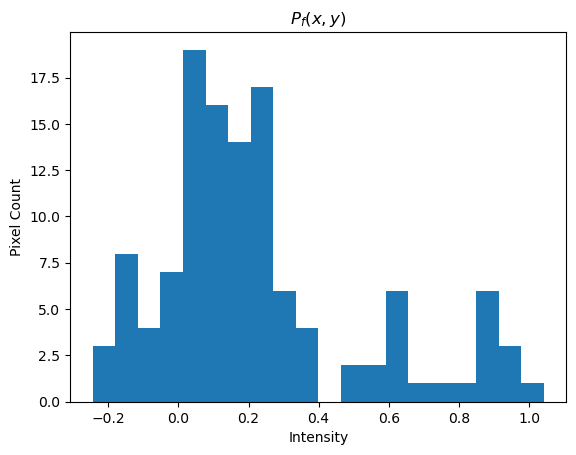

In [56]:
fig, ax1 = plt.subplots(1)
ax1.hist(cross_im.ravel(), 20)
ax1.set_title('$P_f(x,y)$'); 
ax1.set_xlabel('Intensity'); 
ax1.set_ylabel('Pixel Count');

## Applying a threshold to an image

By examining the image and probability distribution function, we can _deduce_ that the underyling model is a whitish phase that makes up the cross and the darkish background

Applying the threshold is a deceptively simple operation

$$ I(x,y) = 
\begin{cases}
1, & f(x,y)\geq0.40 \\
0, & f(x,y)<0.40
\end{cases}$$


In [57]:
threshold  = 0.4
thresh_img = cross_im > threshold

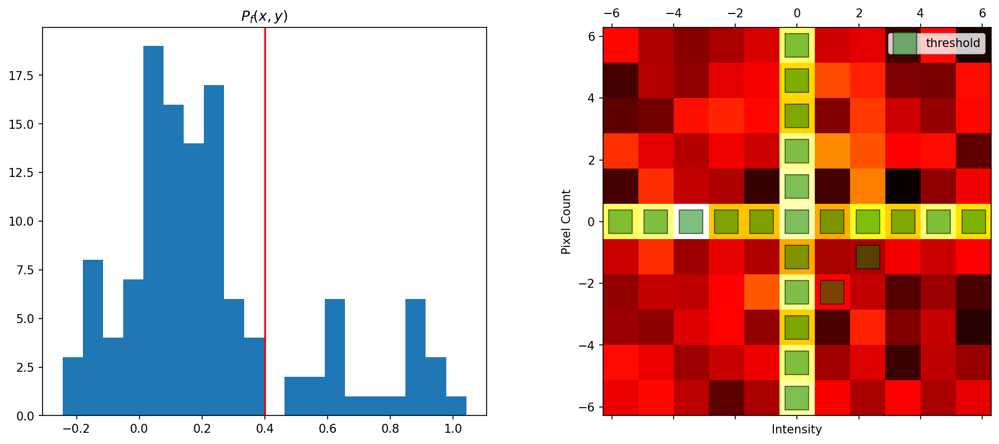

In [58]:
fig, (ax2,ax1) = plt.subplots(1,2,figsize=(15,6),dpi=150)
ax1.matshow(cross_im, cmap = 'hot', extent = [xx.min(), xx.max(), yy.min(), yy.max()])

ax1.plot(xx[np.where(thresh_img)]*0.91, yy[np.where(thresh_img)]*0.91,
         'ks', markerfacecolor = 'green', alpha = 0.5, label = 'threshold', markersize = 20)
ax1.legend();
ax2.hist(cross_im.ravel(), 20)
ax2.set_title('$P_f(x,y)$'); ax1.set_xlabel('Intensity'); ax1.set_ylabel('Pixel Count');

ax2.axvline(x=0.4, color='r');

### Various Thresholds
We can see the effect of choosing various thresholds 

$\gamma\in{}\{0.1,0.26,0.42,0.58,0.74,0.9\}$

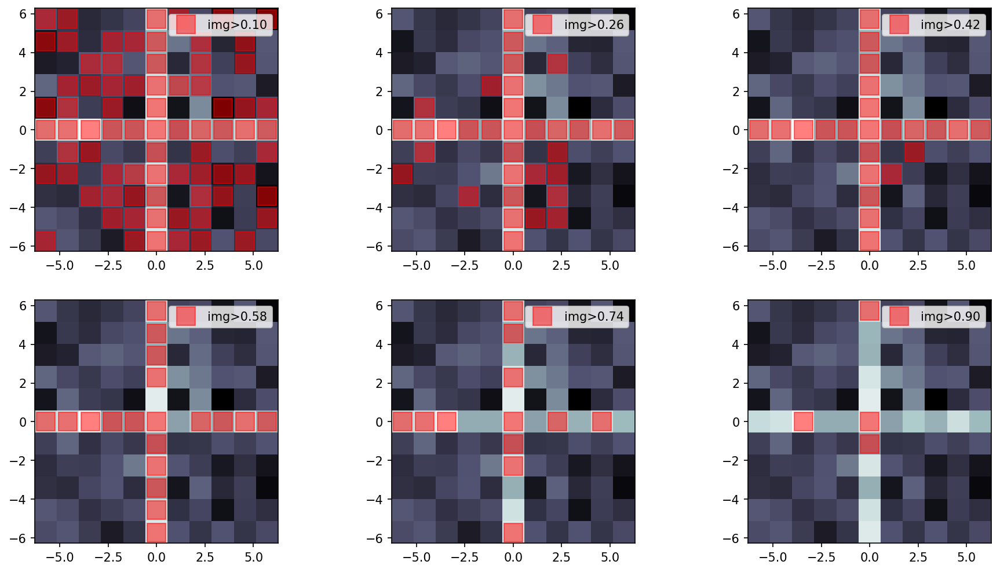

In [59]:
fig, m_axs = plt.subplots(2,3, 
                          figsize = (15, 8),dpi=150)
for c_thresh, ax1 in zip(np.linspace(0.1, 0.9, 6), m_axs.flatten()):
    
    ax1.imshow(cross_im,
               cmap = 'bone', 
               extent = [xx.min(), xx.max(), yy.min(), yy.max()])
    thresh_img = cross_im > c_thresh

    ax1.plot(xx[np.where(thresh_img)]*0.91, yy[np.where(thresh_img)]*0.91, 'rs', alpha = 0.5, label = 'img>%2.2f' % c_thresh, markersize = 15)
    ax1.legend(loc = 1);

In this fabricated example we saw that thresholding can be a very simple and quick solution to the segmentation problem. Unfortunately, real data is often less obvious. The features we want to identify for our qantitative analysis are often obscured be different other features in the image. They may be part of the setup of caused by the acquisition conditions.

# Segmenting Cells

We can peform the same sort of analysis with this image of cells

This time we can derive the model from the basic physics of the system

- The field is illuminated by white light of nearly uniform brightness
- Cells absorb light causing darker regions to appear in the image
- _Lighter_ regions have no cells
- __Darker__ regions have cells

In [60]:
%matplotlib inline
from skimage.io import imread
import matplotlib.pyplot as plt
import numpy as np

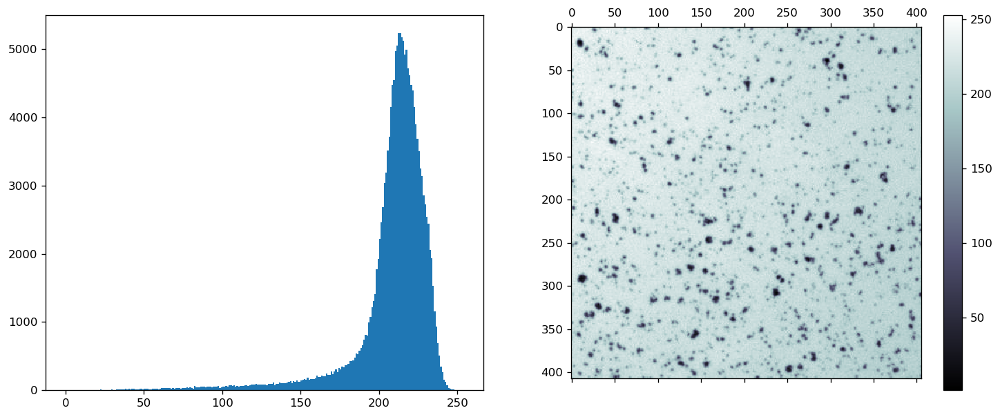

In [11]:
cell_img = imread("figures/Cell_Colony.jpg")

fig, (ax_hist, ax_img) = plt.subplots(1, 2, figsize = (15,6), dpi=120)
ax_hist.hist(cell_img.ravel(), np.arange(255))
ax_obj = ax_img.matshow(cell_img, cmap = 'bone')
plt.colorbar(ax_obj);

## Trying different thresholds on the cell image

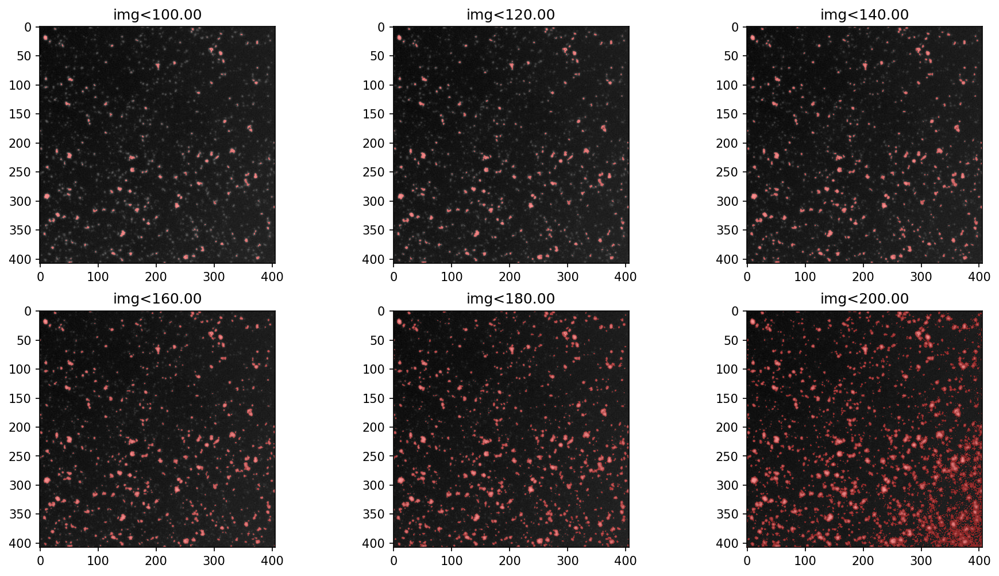

In [25]:
from skimage.color import label2rgb
fig, m_axs = plt.subplots(2,3, 
                          figsize = (15, 8), dpi = 150)
for c_thresh, ax1 in zip(np.linspace(100, 200, 6), m_axs.flatten()):
    thresh_img = cell_img < c_thresh     

    ax1.imshow(label2rgb(thresh_img, image = 1-cell_img, bg_label = 0, alpha = 0.4),interpolation='None') # Rgb coding of image and mask
    
    ax1.set_title('img<%2.2f' % c_thresh)

There is a graylevel gradient in the image!

# Other image types

While scalar images are easiest, it is possible for any type of image
$$ I(x,y) = \vec{f}(x,y) $$

In [18]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

Here, we create an image with vectors to show local orientation and intensities to meassure the streng of a signal.

In [19]:
nx = 10
ny = 10
xx, yy = np.meshgrid(np.linspace(-2*np.pi, 2*np.pi, nx), 
                      np.linspace(-2*np.pi, 2*np.pi, ny))

intensity_img = 1.5*np.abs(np.cos(xx*yy))/(np.abs(xx*yy)+(3*np.pi/nx))+np.random.uniform(-0.25, 0.25, size = xx.shape)

base_df = pd.DataFrame(dict(x = xx.ravel(), 
                            y = yy.ravel(), 
                            I_detector = intensity_img.ravel()))

base_df['x_vec'] = base_df.apply(lambda c_row: c_row['x']/np.sqrt(1e-2+np.square(c_row['x'])+np.square(c_row['y'])), 1)
base_df['y_vec'] = base_df.apply(lambda c_row: c_row['y']/np.sqrt(1e-2+np.square(c_row['x'])+np.square(c_row['y'])), 1)

base_df.sample(5)

,x,y,I_detector,x_vec,y_vec
85,0.698132,4.886922,0.193711,0.141392,0.989746
76,2.094395,3.490659,0.207917,0.514341,0.857234
7,3.490659,-6.283185,0.253510,0.485596,-0.874073
11,-4.886922,-4.886922,-0.158919,-0.707033,-0.707033
44,-0.698132,-0.698132,1.125334,-0.703507,-0.703507


## Looking at colocation histograms

The colocation histogram is a powerful tool to visualize how different components are related to each other. It also called bi-variate histogram. In seaborn, there is the ```pairplot``` which shows colocation histograms for all combinations on the data. The diagonal is the histogram of the individual components.

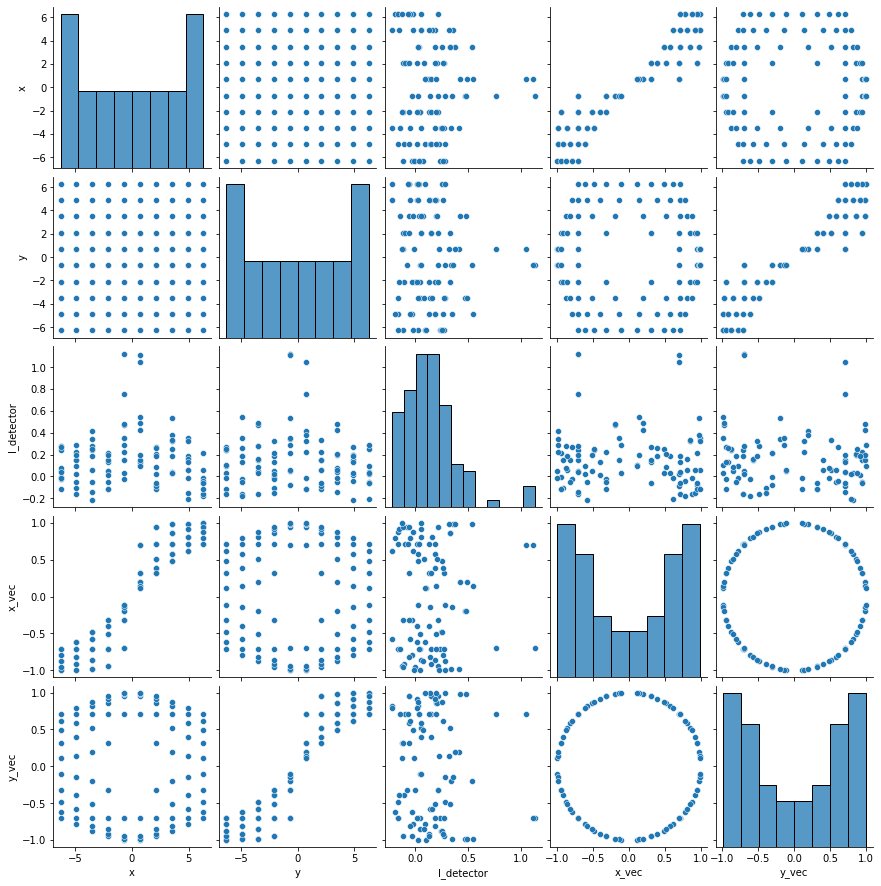

In [20]:
import seaborn as sns
sns.pairplot(base_df);

## Vector field plot

The vector field is a common way to visualiz vector data. It does however only work for small data sets like in this example, otherwise it will be too cluttered and no relevant information will be visible.

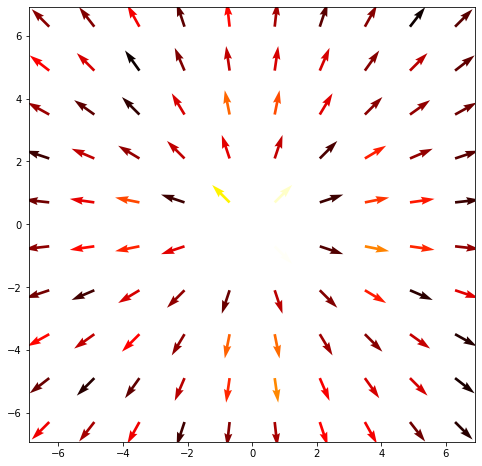

In [21]:
fig, ax1 = plt.subplots(1,1, figsize = (8, 8))
ax1.quiver(base_df['x'], base_df['y'], base_df['x_vec'], base_df['y_vec'], base_df['I_detector'], cmap = 'hot');

## Applying a threshold to vector valued image

A threshold is now more difficult to apply since there are now two distinct variables to deal with. The standard approach can be applied to both
$$ I(x,y) = 
\begin{cases}
1, & \vec{f}_x(x,y) \geq0.25 \text{ and}\\
& \vec{f}_y(x,y) \geq0.25 \\
0, & \text{otherwise}
\end{cases}$$

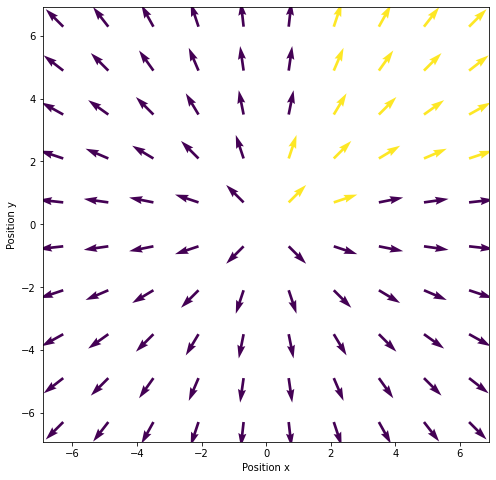

In [22]:
thresh_df = base_df.copy()
thresh_df['thresh'] = thresh_df.apply(lambda c_row: c_row['x_vec']>0.25 and c_row['y_vec']>0.25, 1)

fig, ax1 = plt.subplots(1,1, figsize = (8, 8))
ax1.quiver(thresh_df['x'], thresh_df['y'], thresh_df['x_vec'], thresh_df['y_vec'], thresh_df['thresh']);
ax1.set_xlabel('Position x'); ax1.set_ylabel('Position y');

### Histogram of the vectors
This can also be shown on the joint probability distribution as a bivariate histogram.

The lines here indicate the thresholded vector components.

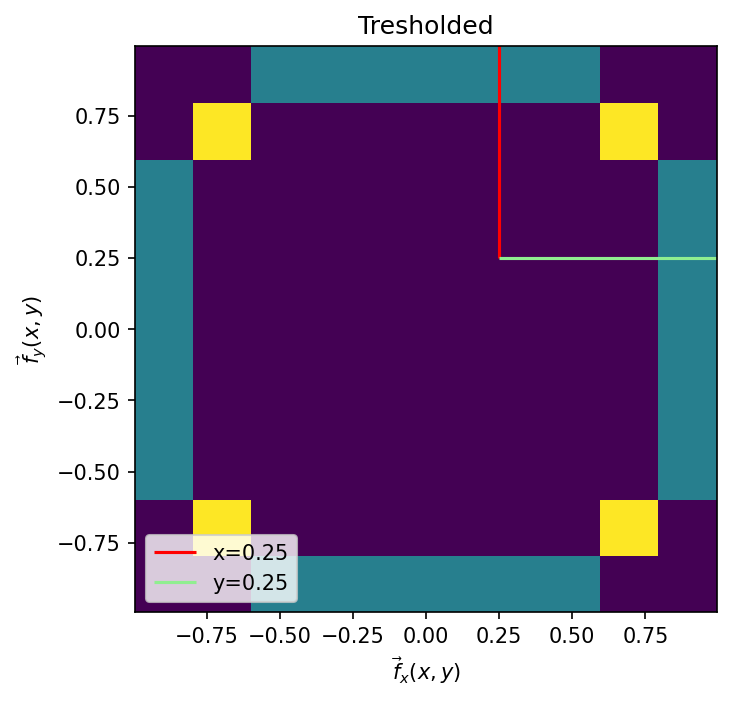

In [23]:
fig, ax = plt.subplots(1,1, figsize = (5, 5), dpi = 150)
ax.hist2d(thresh_df['x_vec'], thresh_df['y_vec'], cmap = 'viridis'); ax.set_title('Tresholded'); 
ax.set_xlabel('$\\vec{f}_x(x,y)$'); ax.set_ylabel('$\\vec{f}_y(x,y)$');
ax.vlines(0.25,ymin=0.25,ymax=1,color='red',label='x=0.25');ax.hlines(0.25,xmin=0.25,xmax=1,color='lightgreen', label='y=0.25');ax.legend(loc='lower left');

### Applying a threshold
Given the presence of two variables; however, more advanced approaches can also be investigated. 
- For example we can keep only components parallel to the x axis by using the dot product.

$$I(x,y)=
\begin{cases}
1,&|\vec{f}(x,y)\cdot{}\vec{i}|=1\\
0,&\text{otherwise}
\end{cases}$$

### Thresholding orientations

We can tune the angular acceptance by using the fact that the scalar product can be expressed using the angle between the the vectors as 

__Scalar product definition__ 

$$\vec{x}\cdot\vec{y}=|\vec{x}| |\vec{y}| \cos(\theta_{x\rightarrow y}) $$
<br />
<br />

$$I(x,y)=
\begin{cases}
1,&\cos^{-1}(\vec{f}(x,y)\cdot \vec{i}) \leq \theta^{\circ} \\
0,&\text{otherwise}
\end{cases}$$